### **Project Description**

In this project an object detection is performed, with a model which uses textual information to identify relevant elements in images.

**Context:**
A staff member (e.g., a human nurse or triage assistant) is conducting initial patient intake at a clinic. As part of this process, the staff member interviews each arriving patient and takes handwritten notes, including details such as personalia, symptoms, background information, required diagnostics. These notes are recorded on a medical_note.png file.

After the triage process, the patients move to a waiting area, shown in **`hospital_waiting_room.png`**, where multiple people are present, including patients, visitors etc.

We develope a code for a hypothetical reception steward robot. This robot is responsible for reading the triage notes and correctly identifying the patient in the waiting room who matches the description.

In [3]:
!pip install python-dotenv

## Utils (Helper Functions):

Pre-made functions to help visualize and plot bounding boxes, as well as parse different types of output.

In [4]:
import json
from PIL import Image, ImageDraw
from PIL import ImageColor
from dotenv import load_dotenv
import re
import os
from IPython.display import display


additional_colors = [colorname for (colorname, colorcode) in ImageColor.colormap.items()]

def plot_bounding_boxes(im, noun_phrases_and_positions):
    """
    Plots bounding boxes on an image with markers for each noun phrase, using PIL, normalized coordinates, and different colors.

    Args:
        img_path: The path to the image file.
        noun_phrases_and_positions: A list of tuples containing the noun phrases
         and their positions in normalized [y1 x1 y2 x2] format.
    """

    # Load the image
    img = im
    width, height = img.size
    print(img.size)
    # Create a drawing object
    draw = ImageDraw.Draw(img)

    # Define a list of colors
    colors = [
    'red',
    'green',
    'blue',
    ] + additional_colors

    # Iterate over the noun phrases and their positions
    for i, (noun_phrase, (y1, x1, y2, x2)) in enumerate(
        noun_phrases_and_positions):
        # Select a color from the list
        color = colors[i % len(colors)]

        # Convert normalized coordinates to absolute coordinates
        abs_x1 = int(x1/1000 * width)
        abs_y1 = int(y1/1000 * height)
        abs_x2 = int(x2/1000 * width)
        abs_y2 = int(y2/1000 * height)

        # Draw the bounding box
        draw.rectangle(
            ((abs_x1, abs_y1), (abs_x2, abs_y2)), outline=color, width=4
        )

        # Draw the text
        draw.text((abs_x1 + 8, abs_y1 + 6), noun_phrase, fill=color)

    # Display the image
    display(img)

# @title Parsing utils
def parse_list_boxes(text):
  result = []
  for line in text.strip().splitlines():
    # Extract the numbers from the line, remove brackets and split by comma
    try:
      numbers = line.split('[')[1].split(']')[0].split(',')
    except:
      numbers =  line.split('- ')[1].split(',')

    # Convert the numbers to integers and append to the result
    result.append([int(num.strip()) for num in numbers])

  return result


def parse_list_boxes_with_label(text):
  text = text.split("```\n")[0]
  return json.loads(text.strip("```").strip("python").strip("json").replace("'", '"').replace('\n', '').replace(',}', '}'))



def parse_json_in_output(output):
    """
    Extracts and converts JSON-like data from the given text output to a Python dictionary.

    Args:
        output (str): The text output containing the JSON data.

    Returns:
        dict: The parsed JSON data as a Python dictionary.
    """
    # Regex to extract JSON-like portion
    json_match = re.search(r"\{.*?\}", output, re.DOTALL)
    if json_match:
        json_str = json_match.group(0)


        # Fix single quotes and ensure proper JSON formatting
        json_str = json_str.replace("'", '"')  # Replace single quotes with double quotes
        print(json_str)
        try:
            # Convert the fixed JSON string into a dictionary
            json_data = json.loads(json_str)
            return json_data
        except json.JSONDecodeError:
            return "The extracted JSON is still not valid after formatting."
    else:
        return "No JSON data found in the given output."

### <b>Loading and Visualizing Images</b>




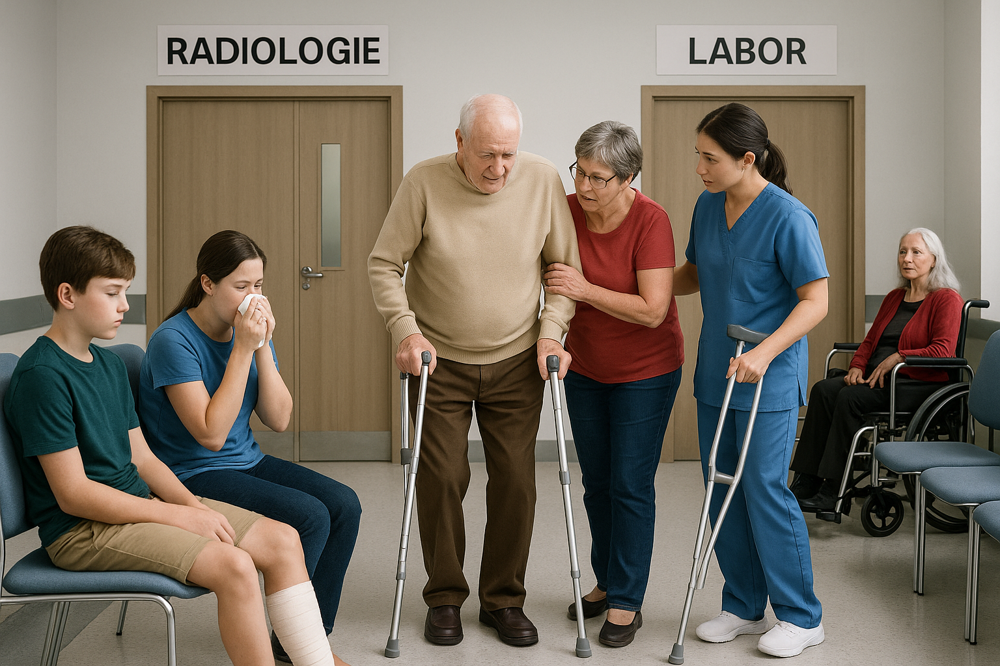

In [1]:
from PIL import Image
image_path = "hospital_waiting_room.png"

im = Image.open(image_path)
im

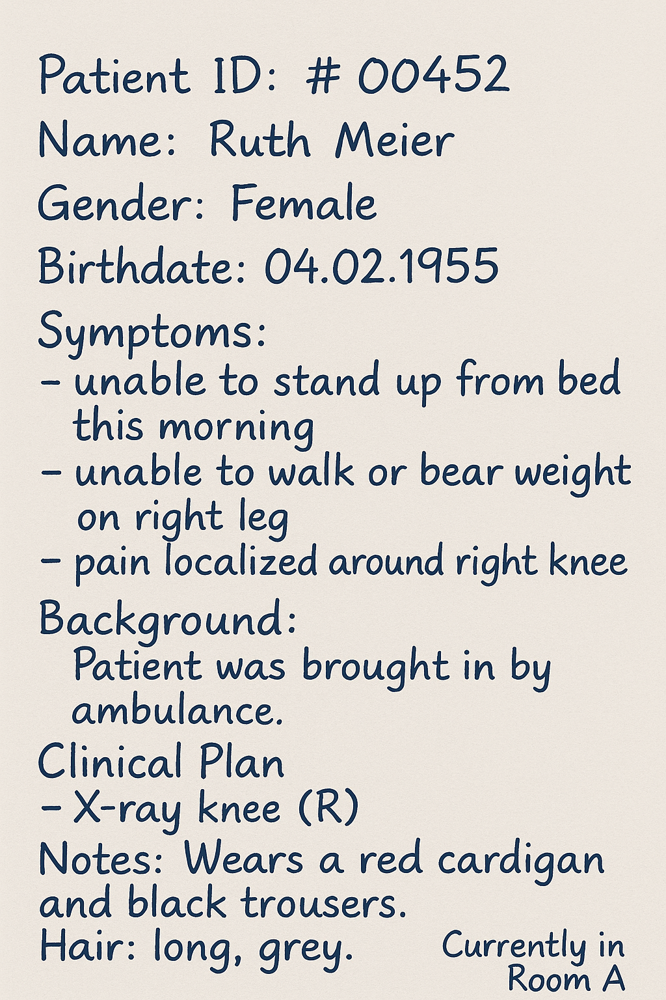

In [5]:
from PIL import Image
image_path2 = "medical_note.png"

im2 = Image.open(image_path2)
im2

### <b>Definition of a Structured Schema for Information Extraction</b>

In [6]:
template_answer = {
  "type": "json_schema",
  "json_schema": {
    "name": "img_extract",
    "schema": {
      "type": "object",
      "properties": {
        "numberOfPeople": {
          "type": "integer",
          "description": "The total number of people visible in the scene",
          "minimum": 0
        },
        "people": {
          "type": "array",
          "description": "Details about each person in the scene",
          "items": {
            "type": "object",
            "properties": {
              "positionInFrame": {
                "type": "string",
                "description": "Approximate location in the image frame (e.g., foreground, background)"
              },
              "position": {
                "type": "string",
                "description": "Body posture of the person (e.g., lying, sitting, standing)"
              },
              "estimatedAge": {
                "type": "integer",
                "description": "Estimated age of the person",
                "minimum": 0
              },
              "activity": {
                "type": "string",
                "description": "What the person is doing (e.g., injured, helping, observing)"
              },
              "gender": {
                "type": "string",
                "description": "Perceived gender identity",
                "enum": ["male", "female", "non-binary", "other", "prefer not to say"]
              },
              "injurySeverity": {
                "type": "string",
                "description": "Visible injury level",
                "enum": ["critical", "moderate", "minor", "none"]
              },
              "clothes": {
                "type": "string",
                "description": "Type and color of clothes",
              },
              "conscious": {
                "type": "boolean",
                "description": "Is the person conscious?"
              }
            },
            "required": [
              "positionInFrame",
              "position",
              "estimatedAge",
              "activity",
              "gender",
              "injurySeverity",
              "conscious"
            ]
          }
        }
      },
      "required": ["numberOfPeople", "people"]
    }
  }
}


sysprompt =  "you are a careful and experienced rescuer. Answer precisily following the json schema."
prompt = "Describe in detail the scene. Check out for humans, do not miss any."

# Path to your image
image_path = "hospital_waiting_room.png"

### <b>Extraction of Visual Information via Prompting</b>
Extracting structured visual information from the image medical_note1.png using textual prompting to obtain the data needed for patient identification.



In [7]:
import base64
from openai import OpenAI
load_dotenv()

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))

# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


base64_image = encode_image(image_path)

completion = client.chat.completions.create(
    temperature = 0.7,
    model="gpt-4o-mini",
    response_format = template_answer,
    messages=[{"role": "system", "content" : sysprompt},
        {
            "role": "user",
            "content": [
                { "type": "text", "text": prompt},
                {
                    "type": "image_url",
                    "image_url": {
                        "url": f"data:image/jpeg;base64,{base64_image}",
                    },
                },
            ],
        }
    ],
)

detailed_description=  json.loads(completion.choices[0].message.content)



In [8]:
detailed_description

{'numberOfPeople': 5,
 'people': [{'positionInFrame': 'foreground',
   'position': 'sitting',
   'estimatedAge': 12,
   'activity': 'waiting',
   'gender': 'male',
   'injurySeverity': 'none',
   'clothes': 'green t-shirt and beige shorts',
   'conscious': True},
  {'positionInFrame': 'foreground',
   'position': 'sitting',
   'estimatedAge': 15,
   'activity': 'crying',
   'gender': 'female',
   'injurySeverity': 'none',
   'clothes': 'blue t-shirt and dark jeans',
   'conscious': True},
  {'positionInFrame': 'foreground',
   'position': 'standing',
   'estimatedAge': 75,
   'activity': 'walking with assistance',
   'gender': 'male',
   'injurySeverity': 'none',
   'clothes': 'beige sweater and brown pants',
   'conscious': True},
  {'positionInFrame': 'foreground',
   'position': 'standing',
   'estimatedAge': 65,
   'activity': 'assisting',
   'gender': 'female',
   'injurySeverity': 'none',
   'clothes': 'red shirt and blue jeans',
   'conscious': True},
  {'positionInFrame': 'back

### <b>Processing the Textual Output of Visual Extraction - medical note</b>


In [9]:
client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))

# Zakodowanie obrazu
def encode_image(image_path):
    with open(image_path2, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

image_path2 = "medical_note.png"
base64_image = encode_image(image_path)

# Prompt
system_prompt = "You are a medical assistant. Analyze handwritten or printed medical notes and summarize their contents clearly."
user_prompt = "Please analyze this medical note and summarize what it says in plain language."

# Wywołanie modelu
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {"role": "system", "content": system_prompt},
        {
            "role": "user",
            "content": [
                {"type": "text", "text": user_prompt},
                {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{base64_image}"}}
            ]
        }
    ]
)

description = response.choices[0].message.content
print("Opis zawartości notatki medycznej:")
print(description)


Opis zawartości notatki medycznej:
The medical note is about a patient named Ruth Meier, a female born on April 2, 1955. She was brought to the hospital by ambulance because she couldn't stand up from bed this morning. She is unable to walk or put weight on her right leg, with pain located around the right knee. The plan is to take an X-ray of her right knee. She was wearing a red cardigan and black trousers, and has long grey hair. She is currently in Room A.


### <b>Processing the Textual Output of Visual Extraction - waiting room</b>

In [10]:
from openai import OpenAI
import os

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))

alert_sys_prompt = "You are an experienced first aid paramedic."
alert_prompt = (
    "Extract from the following scene analysis (given in JSON format), "
    "we need to identify people in the waiting room and their conditions. Give a concise answer. "
    "The situation is given to you from this object:\n" + json.dumps(detailed_description)
)

response = client.chat.completions.create(
    model="gpt-4o-mini",
    temperature=0.3,
    messages=[
        {"role": "system", "content": alert_sys_prompt},
        {"role": "user", "content": alert_prompt}
    ]
)

summary = response.choices[0].message.content
print(summary)


In the waiting room, there are 5 people with the following conditions:

1. Male, 12 years old, sitting, waiting, no injuries, conscious (green t-shirt and beige shorts).
2. Female, 15 years old, sitting, crying, no injuries, conscious (blue t-shirt and dark jeans).
3. Male, 75 years old, standing, walking with assistance, no injuries, conscious (beige sweater and brown pants).
4. Female, 65 years old, standing, assisting, no injuries, conscious (red shirt and blue jeans).
5. Female, 80 years old, sitting, waiting, no injuries, conscious (red cardigan and gray hair).


### <b>Integration of Extracted Data into a New Prompt for Further Identification</b>
Creating a prompt needed to identify the correspondent person in hospital_waiting_room.png. Integrating this information using the data structure created in the previous cells.

In [11]:
from openai import OpenAI
import os

client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))

# System prompt and user prompt
alert_sys_prompt = "You are an experienced first aid paramedic."
alert_prompt = (
    "Extract from the following scene analysis (given in JSON format), "
    "we need to identify people in the waiting room compared to the medical note (given in text format). Give a concise answer with coordinates of the described person. "
    "The situation is given to you from this object:\n" + json.dumps(detailed_description) +
    "The medical note is:\n" + description
)

# Call the model
response = client.chat.completions.create(
    model="gpt-4o-mini",
    temperature=0.3,
    messages=[
        {"role": "system", "content": alert_sys_prompt},
        {"role": "user", "content": alert_prompt}
    ]
)

# Get the answer
summary = response.choices[0].message.content
print(summary)


Based on the scene analysis and the medical note, the person that matches the description of Ruth Meier is:

- **Gender**: Female
- **Estimated Age**: 80
- **Clothes**: Red cardigan and gray hair
- **Activity**: Waiting

The coordinates of Ruth Meier in the waiting room are in the background, sitting position. 

**Coordinates**: Background, sitting, estimated age 80, wearing a red cardigan and gray hair.


### <b>Visualization of Bounding Boxes</b>

In [12]:
client = OpenAI(api_key=os.getenv("OPENAI_API_KEY"))

def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")

image_path = "hospital_waiting_room.png"
base64_image = encode_image(image_path)

completion = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text":
                    "Analyze this image and determine if there is a single person matching this description: "
                    + description
                    + ". Return only the bounding box coordinates for the most relevant person as [ymin, xmin, ymax, xmax]. "
                    "If no matching person, return an empty list []. Just output the list."
                },
                {
                    "type": "image_url",
                    "image_url": {
                        "url": f"data:image/png;base64,{base64_image}",
                    },
                },
            ],
        }
    ],
)

# Get response
response = str(completion.choices[0].message.content)
print("Detected people bounding boxes:", response)


Detected people bounding boxes: [225, 860, 556, 1069]


In [13]:
response

'[225, 860, 556, 1069]'

(1536, 1024)


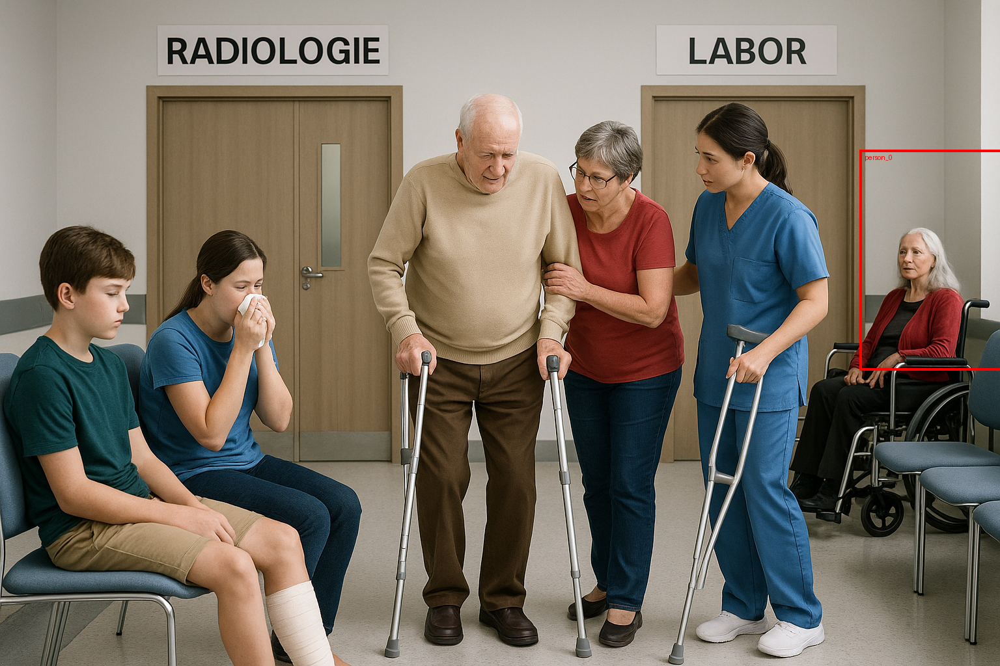

In [14]:
boxes = parse_list_boxes(response)
boxes_dict = {f'person_{i}': box for i, box in enumerate(boxes)}
plot_bounding_boxes(im, noun_phrases_and_positions=list(boxes_dict.items()))